# Importing useful libraries

In [1]:
# load useful libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
from scipy import stats
from scipy.stats import norm 
import math
from matplotlib import gridspec
from scipy.stats import chi2_contingency
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

# loading useful libraries as shown in module 4.2
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix

# importing utils (helpers equivalent?)
#import plot_utils as pu
# from plot_utils import hist_multi

import sys
sys.path.append("../helpers")

from helpers import run_eda_test, plot_multiple_hists


# Data Loading & Looking over the Data

In [ ]:
#!git clone https://github.com/iampaulanca/USD-AAI-501-Group-3.git
#!cd AAI-501-Introduction to AI

In [2]:
# reading in the stroke file & seeing first few rows of data
students = pd.read_csv('Student_performance_data.csv')
students.head()

,StudentID,Age,Gender,Ethnicity,ParentalEducation,StudyTimeWeekly,Absences,Tutoring,ParentalSupport,Extracurricular,Sports,Music,Volunteering,GPA,GradeClass
0,1001,17,1,0,2,19.833723,7,1,2,0,0,1,0,2.929196,2.0
1,1002,18,0,0,1,15.408756,0,0,1,0,0,0,0,3.042915,1.0
2,1003,15,0,2,3,4.210570,26,0,2,0,0,0,0,0.112602,4.0
3,1004,17,1,0,3,10.028829,14,0,3,1,0,0,0,2.054218,3.0
4,1005,17,1,0,2,4.672495,17,1,3,0,0,0,0,1.288061,4.0


In [3]:
# dropping unncecessary columns
# removing GPA here due to discussions regarding when to remove
students.drop(columns=['StudentID','GPA'], inplace=True)

In [4]:
# descriptive statistics
students.describe()

,Age,Gender,Ethnicity,ParentalEducation,StudyTimeWeekly,Absences,Tutoring,ParentalSupport,Extracurricular,Sports,Music,Volunteering,GradeClass
count,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000,2392.000000
mean,16.468645,0.510870,0.877508,1.746237,9.771992,14.541388,0.301421,2.122074,0.383361,0.303512,0.196906,0.157191,2.983696
std,1.123798,0.499986,1.028476,1.000411,5.652774,8.467417,0.458971,1.122813,0.486307,0.459870,0.397744,0.364057,1.233908
min,15.000000,0.000000,0.000000,0.000000,0.001057,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15.000000,0.000000,0.000000,1.000000,5.043079,7.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,16.000000,1.000000,0.000000,2.000000,9.705363,15.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,17.000000,1.000000,2.000000,2.000000,14.408410,22.000000,1.000000,3.000000,1.000000,1.000000,0.000000,0.000000,4.000000
max,18.000000,1.000000,3.000000,4.000000,19.978094,29.000000,1.000000,4.000000,1.000000,1.000000,1.000000,1.000000,4.000000


In [5]:
# count of missing values per column
students.isnull().sum()

Age                  0
Gender               0
Ethnicity            0
ParentalEducation    0
StudyTimeWeekly      0
Absences             0
Tutoring             0
ParentalSupport      0
Extracurricular      0
Sports               0
Music                0
Volunteering         0
GradeClass           0
dtype: int64

In [6]:
# understanding data types
students.dtypes

Age                    int64
Gender                 int64
Ethnicity              int64
ParentalEducation      int64
StudyTimeWeekly      float64
Absences               int64
Tutoring               int64
ParentalSupport        int64
Extracurricular        int64
Sports                 int64
Music                  int64
Volunteering           int64
GradeClass           float64
dtype: object

# Converting columns with numeric codes to category dtype (referencing Paul's code)

In [7]:
# referencing paul's code
categorical_cols = [
    'Gender',
    'Ethnicity',
    'ParentalEducation',
    'ParentalSupport',
    'Tutoring',
    'Extracurricular',
    'Sports',
    'Music',
    'Volunteering'
]
students[categorical_cols] = students[categorical_cols].astype('category')

In [8]:
students_category = students.select_dtypes(include=['category'])
students_numeric = students.select_dtypes(include='number')
students.dtypes

Age                     int64
Gender               category
Ethnicity            category
ParentalEducation    category
StudyTimeWeekly       float64
Absences                int64
Tutoring             category
ParentalSupport      category
Extracurricular      category
Sports               category
Music                category
Volunteering         category
GradeClass            float64
dtype: object

In [9]:
# mapping directories for each categorical column
label_maps = {
    "Gender": {0: "Male", 1: "Female"
    },
    "Ethnicity": {
        0: "Caucasian",
        1: "African American",
        2: "Asian",
        3: "Other"
    },
    "ParentalEducation": {
        0: "None",
        1: "High School",
        2: "Some College",
        3: "Bachelor's",
        4: "Higher",
    },
    "Tutoring": {0: "No", 1: "Yes"},
    "Extracurricular": {0: "No", 1: "Yes"},
    "Sports": {0: "No", 1: "Yes"},
    "Music": {0: "No", 1: "Yes"},
    "Volunteering": {0: "No", 1: "Yes"},
    "GradeClass": {
        0: "A",
        1: "B",
        2: "C",
        3: "D",
        4: "F"
    }
}

# Column descriptions (based on your dataset dictionary)
column_descriptions = {
    "StudentID": "Unique identifier for each student.",
    "Age": "Age of the student.",
    "Gender": "Student gender.",
    "Ethnicity": "Student ethnicity.",
    "ParentalEducation": "Highest level of parental education.",
    "StudyTimeWeekly": "Average weekly study time in hours.",
    "Absences": "Total number of school absences.",
    "Tutoring": "Indicates whether the student receives tutoring.",
    "ParentalSupport": "Level of parental support for the student.",
    "Extracurricular": "Participation in extracurricular activities.",
    "Sports": "Participation in sports programs.",
    "Music": "Participation in music activities.",
    "Volunteering": "Participation in volunteering or community service.",
    "GPA": "Student’s Grade Point Average.",
    "GradeClass": "Overall academic performance represented by letter grade."
}
    

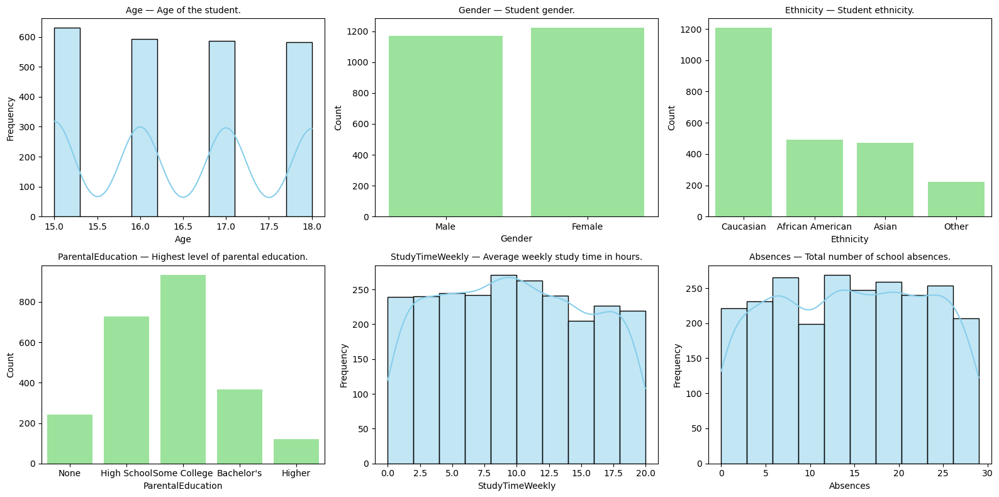

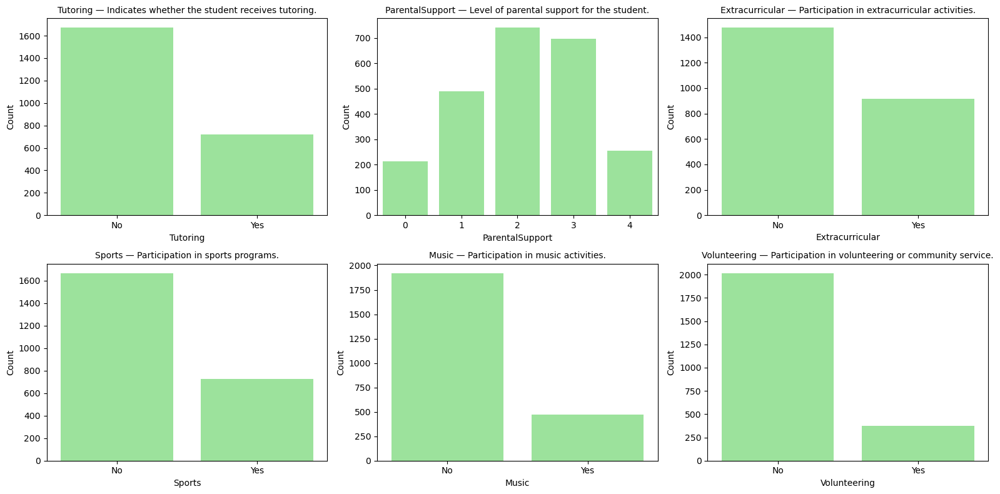

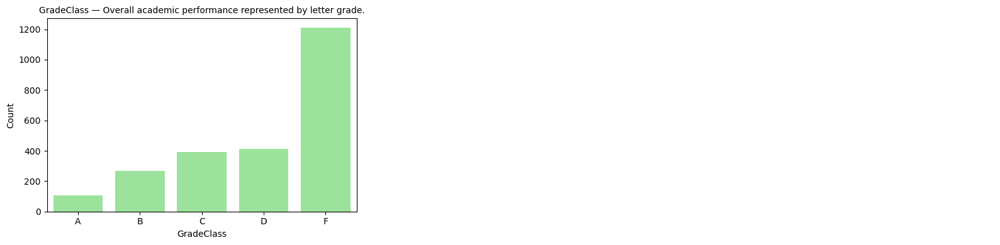

In [10]:
# end of referencing paul's code
plot_multiple_hists(
    students,
    columns=students.columns[:6],
    label_maps=label_maps,
    column_descriptions=column_descriptions,
    ncols=3,
    figsize=(16, 8),
)
plot_multiple_hists(
    students,
    columns=students.columns[6:12],
    label_maps=label_maps,
    column_descriptions=column_descriptions,
    ncols=3,
    figsize=(16, 8)
)

plot_multiple_hists(
    students,
    columns=students.columns[12:],
    label_maps=label_maps,
    column_descriptions=column_descriptions,
    ncols=3,
    figsize=(16, 4)
)

## Examining the Relationship between Variables and GradeClass 

[ChatGPT Disclosure] ChatGPT was used to help structure the for statement iterating through all the variables to plot in order to make the code cleaner than the original format (as shown in the example referenced below)

Used count and plot structure from AAI500 Project --> Example: age_stack = student.groupby(['GradeClass', 'Age']).size().unstack().plot(ax=ax1, kind='bar', stacked=True, xlabel='GradeClass', ylabel='Frequency', title='Grade Class by Age', rot=45, color=colors)

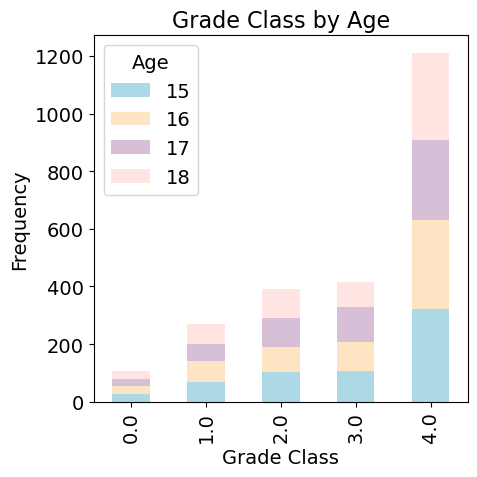

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


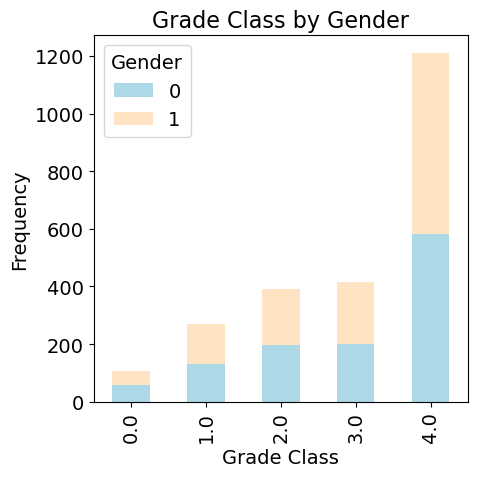

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


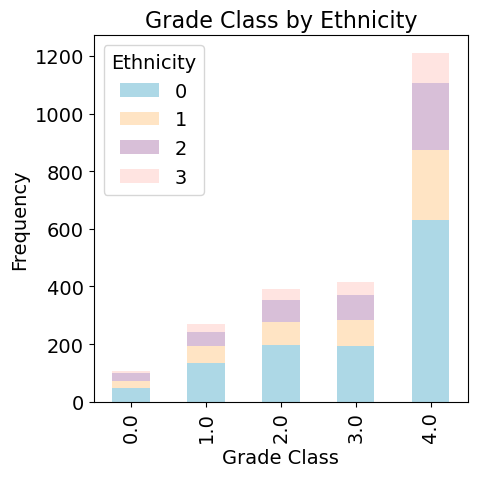

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


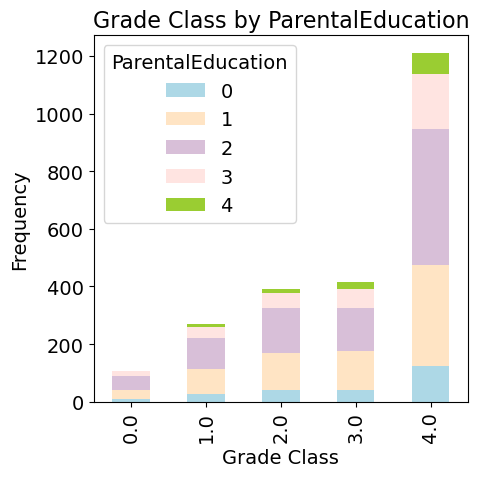

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:26: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\geary\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


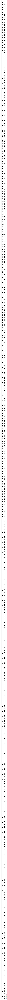

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


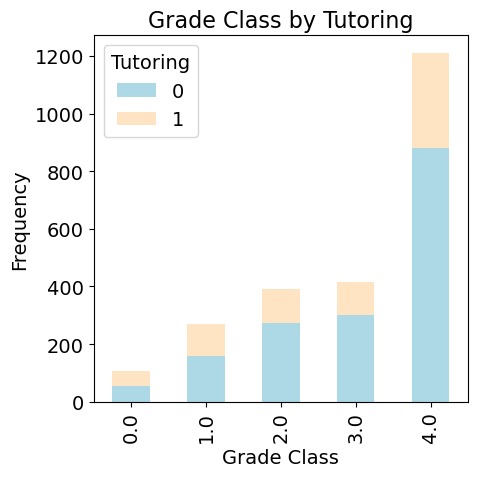

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


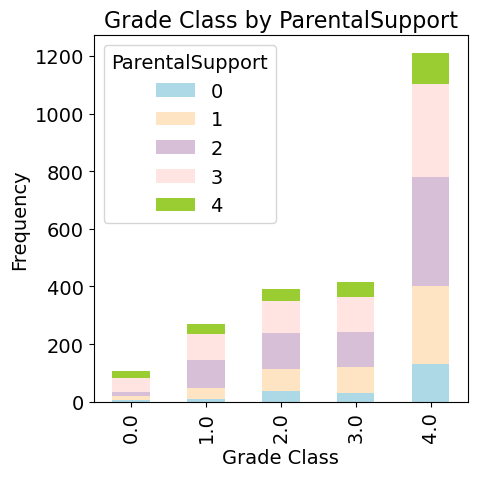

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


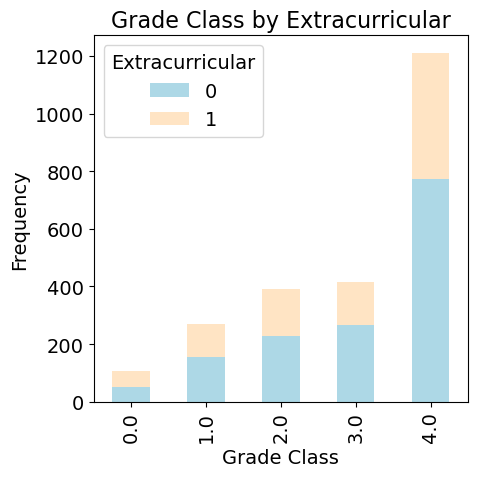

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


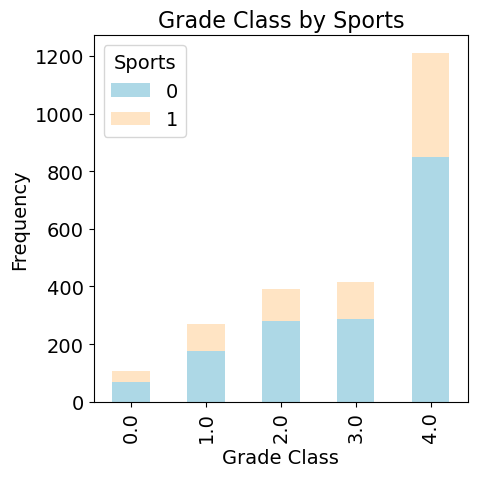

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


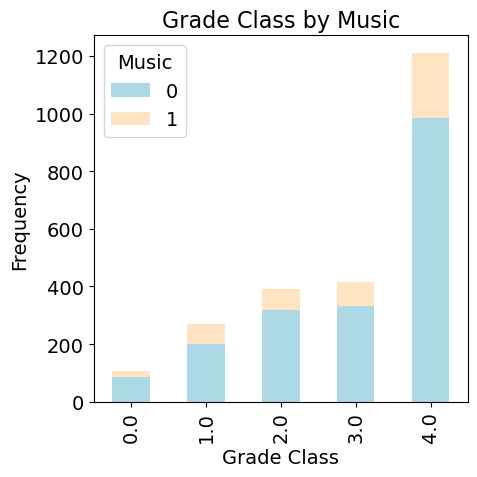

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


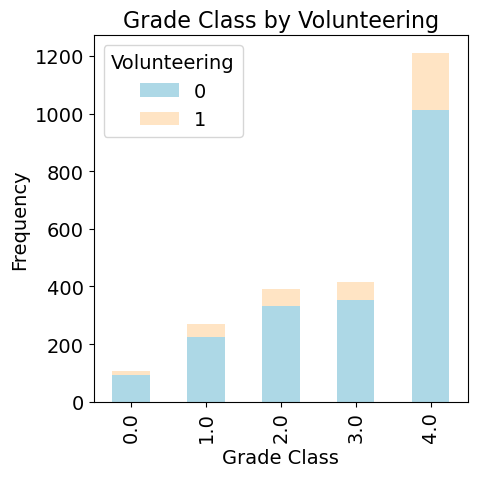

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\3559805494.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", column])


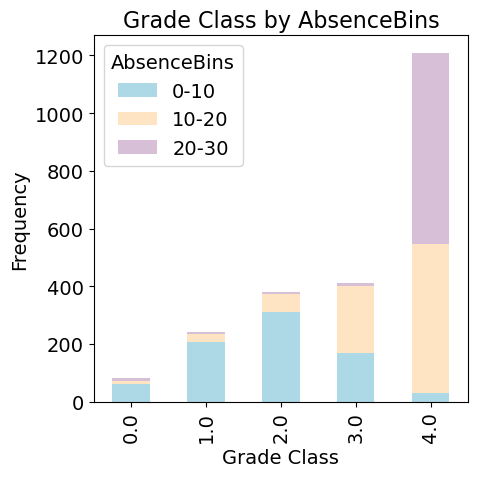

In [54]:
#defining color scheme so labeling is legable
colors = ['lightblue', 'bisque', 'thistle', 'mistyrose','yellowgreen']
#plt.rc('axes', titlesize=16)

stacked_columns = students.columns.drop(['Absences', 'GradeClass'])
# print(stacked_columns)

for column in stacked_columns:
    count = (
    students.groupby(["GradeClass", column])
    .size()
    .unstack(fill_value=0)
    )

    ax = count.plot(
    kind="bar",
    stacked=True,
    figsize=(5, 5),
    title=f"Grade Class by {column}",
    xlabel ="Grade Class",
    ylabel="Frequency",
    color=colors
    )

    ax.legend(title=column)
    plt.tight_layout()
    plt.show()



[ChatGPT Disclosure] - used ChatGPT to help with how to bin the absences so it's a legible plot

C:\Users\geary\AppData\Local\Temp\ipykernel_23272\312263349.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  students.groupby(["GradeClass", "AbsenceBins"])


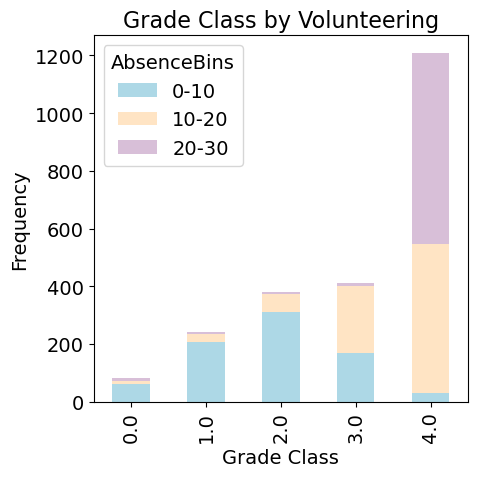

In [31]:
# creating a plot for absences
bins = [0, 10, 20, 30]
labels = ["0-10", "10-20", "20-30"]
students["AbsenceBins"] = pd.cut(students["Absences"], bins=bins, labels=labels)

count_absences = (
    students.groupby(["GradeClass", "AbsenceBins"])
    .size()
    .unstack(fill_value=0)
    )

count_absences.plot(
    kind="bar",
    stacked=True,
    figsize=(5, 5),
    title=f"Grade Class by {column}",
    xlabel ="Grade Class",
    ylabel="Frequency",
    color=colors
    )

plt.tight_layout()
plt.show()

# Correlation Matrix and Heatmap

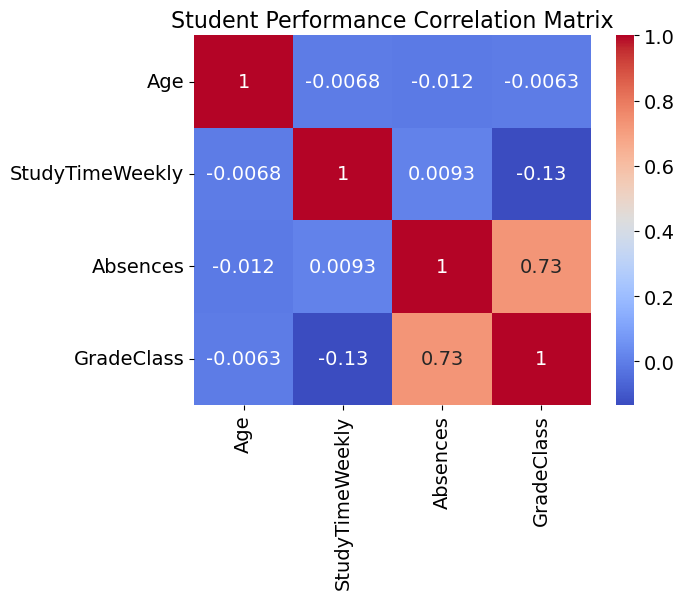

In [36]:
students_corr_matrix = students_numeric.corr() # reusing the students_numeric from paul's code

# creating a heatmap
sns.heatmap(students_corr_matrix, annot=True, cmap="coolwarm")
plt.title("Student Performance Correlation Heatmap of Numeric Features")
plt.show()

# Finding correlations

In [61]:
# referencing assignment 4-2 code for finding correlations
X = students_numeric.drop(columns="GradeClass")
y = students["GradeClass"]
df = pd.concat([X, y], axis=1)

corr_with_target = df.corr()["GradeClass"].sort_values(ascending=False)
print(corr_with_target)


GradeClass         1.000000
Absences           0.728633
Age               -0.006250
StudyTimeWeekly   -0.134131
Name: GradeClass, dtype: float64


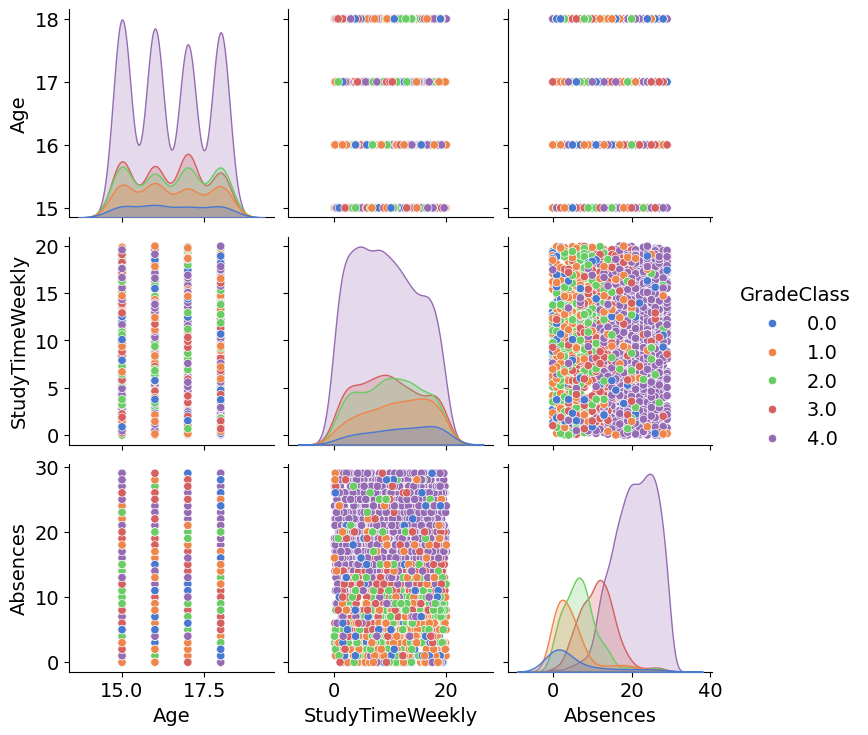

In [69]:
features = X
target = y
df = pd.concat([features, target], axis=1)

sns.pairplot(
    df,
    hue="GradeClass",
    palette="muted",    
)
plt.show()


## Interpreting Heatmap, Correlation and SNS Plot

Based on the heatmap, of the numeric features, absences show the strongest correlation to the target of "GradeClass". Study time showed less of a correlation than expected.

## Creating Frequency Tables for the discrete variables - reference the analysis I did for my AAI 500 project

wanted to understand if there's imbalance as well as look at some categorical statistical tests

In [80]:
# referencing AAI 500

bold = '\033[1m'
normal = '\033[0m'

# Age Frequency Table
print(f'{bold}Frequncy Table - Age{normal}')
age_table = pd.crosstab(students['Age'], students['GradeClass'])
print(age_table)
print(' ')
print(pd.crosstab(students['Age'], students['GradeClass'], normalize='index'))
print('\n')

# Gender Frequency Table
print(f'{bold}Frequncy Table - Gender{normal}')
gender_table = pd.crosstab(students['Gender'], students['GradeClass'])
print(gender_table)
print(' ')
print(pd.crosstab(students['Gender'], students['GradeClass'], normalize='index'))
print('\n')

# Ethnicity Frequency Table
print(f'{bold}Frequncy Table - Ethnicity{normal}')
ethnicity_table = pd.crosstab(students['Ethnicity'], students['GradeClass'])
print(ethnicity_table)
print(' ')
print(pd.crosstab(students['Ethnicity'], students['GradeClass'], normalize='index'))
print('\n')

# ParentalEducation Frequency Table
print(f'{bold}Frequncy Table - ParentalEducation{normal}')
pe_table = pd.crosstab(students['ParentalEducation'], students['GradeClass'])
print(pe_table)
print(' ')
print(pd.crosstab(students['ParentalEducation'], students['GradeClass'], normalize='index'))
print('\n')

# StudyTimeWeekly Frequency Table
print(f'{bold}Frequncy Table - StudyTimeWeekly{normal}')
stw_table = pd.crosstab(students['StudyTimeWeekly'], students['GradeClass'])
print(stw_table)
print(' ')
print(pd.crosstab(students['StudyTimeWeekly'], students['GradeClass'], normalize='index'))
print('\n')

# Absences Frequency Table
print(f'{bold}Frequncy Table - Absences{normal}')
absences_table = pd.crosstab(students['Absences'], students['GradeClass'])
print(absences_table)
print(' ')
print(pd.crosstab(students['Absences'], students['GradeClass'], normalize='index'))
print('\n')

# Tutoring Frequency Table
print(f'{bold}Frequncy Table - Tutoring{normal}')
tutoring_table = pd.crosstab(students['Tutoring'], students['GradeClass'])
print(tutoring_table)
print(' ')
print(pd.crosstab(students['Tutoring'], students['GradeClass'], normalize='index'))
print('\n')

# Parental Support Frequency Table
print(f'{bold}Frequncy Table - ParentalSupport{normal}')
ps_table = pd.crosstab(students['ParentalSupport'], students['GradeClass'])
print(ps_table)
print(' ')
print(pd.crosstab(students['ParentalSupport'], students['GradeClass'], normalize='index'))
print('\n')

# Extracurricular Frequency Table
print(f'{bold}Frequncy Table - Extracurricular{normal}')
extra_table = pd.crosstab(students['Extracurricular'], students['GradeClass'])
print(extra_table)
print(' ')
print(pd.crosstab(students['Extracurricular'], students['GradeClass'], normalize='index'))
print('\n')

# Sports Frequency Table
print(f'{bold}Frequncy Table - Sports{normal}')
sports_table = pd.crosstab(students['Sports'], students['GradeClass'])
print(sports_table)
print(' ')
print(pd.crosstab(students['Sports'], students['GradeClass'], normalize='index'))
print('\n')

# Music Frequency Table
print(f'{bold}Frequncy Table - Music{normal}')
music_table = pd.crosstab(students['Music'], students['GradeClass'])
print(music_table)
print(' ')
print(pd.crosstab(students['Music'], students['GradeClass'], normalize='index'))
print('\n')

# Volunterring Frequency Table
print(f'{bold}Frequncy Table - Volunteering{normal}')
volunteer_table = pd.crosstab(students['Volunteering'], students['GradeClass'])
print(volunteer_table)
print(' ')
print(pd.crosstab(students['Volunteering'], students['GradeClass'], normalize='index'))
print('\n')


Frequncy Table - Age
GradeClass  0.0  1.0  2.0  3.0  4.0
Age                                
15           27   70  103  108  322
16           29   72   87   98  307
17           24   60  100  122  281
18           27   67  101   86  301
 
GradeClass       0.0       1.0       2.0       3.0       4.0
Age                                                         
15          0.042857  0.111111  0.163492  0.171429  0.511111
16          0.048904  0.121417  0.146712  0.165261  0.517707
17          0.040886  0.102215  0.170358  0.207836  0.478705
18          0.046392  0.115120  0.173540  0.147766  0.517182


Frequncy Table - Gender
GradeClass  0.0  1.0  2.0  3.0  4.0
Gender                             
0            58  132  197  201  582
1            49  137  194  213  629
 
GradeClass       0.0       1.0       2.0       3.0       4.0
Gender                                                      
0           0.049573  0.112821  0.168376  0.171795  0.497436
1           0.040098  0.112111  0.158756

## Examining Chi Test results to determine relationship between GradeClass and Dependent Variables

In [90]:
# Using from AAI 500 Module 5 Lab - Creating function for ch-square test to determine relationships
from scipy.stats import chi2_contingency

def chisquare_test(table):
    stat, p_value, dof, expected = chi2_contingency(table, correction=False)
    # Interpret p-value
    alpha = 0.05
    print("The p-value is {}".format(p_value))
    if p_value <= alpha:
        print(f'{bold}YES{normal} Relationship between variables')
    else:
        print(f'{bold}NO{normal} relationship between variables.')

In [91]:
# Perform chi-square test to determine if there is a relationship between GradeClass and age
print(f'{bold}Chi-Square Test - Age{normal}')
chisquare_test(age_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and gender
print(f'{bold}Chi-Square Test - Gender{normal}')
chisquare_test(gender_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and ethnicity
print(f'{bold}Chi-Square Test - Ethnicity{normal}')
chisquare_test(ethnicity_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and ParentalEducation
print(f'{bold}Chi-Square Test - ParentalEducation{normal}')
chisquare_test(pe_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and StudyTimeWeekly
print(f'{bold}Chi-Square Test - StudyTimeWeekly{normal}')
chisquare_test(stw_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and Absences
print(f'{bold}Chi-Square Test - Absences{normal}')
chisquare_test(absences_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and Tutoring
print(f'{bold}Chi-Square Test - Tutoring{normal}')
chisquare_test(tutoring_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and ParentalSupport
print(f'{bold}Chi-Square Test - ParentalSupport{normal}')
chisquare_test(ps_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and Extracurricular
print(f'{bold}Chi-Square Test - Extracurricular{normal}')
chisquare_test(extra_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and Sports
print(f'{bold}Chi-Square Test - Sports{normal}')
chisquare_test(sports_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and Music
print(f'{bold}Chi-Square Test - Music{normal}')
chisquare_test(music_table)
print('\n')

# Perform chi-square test to determine if there is a relationship between GradeClass and Volunteering
print(f'{bold}Chi-Square Test - Volunteering{normal}')
chisquare_test(volunteer_table)
print('\n')

Chi-Square Test - Age
The p-value is 0.5505003315085419
NO relationship between variables.


Chi-Square Test - Gender
The p-value is 0.7513204328843887
NO relationship between variables.


Chi-Square Test - Ethnicity
The p-value is 0.7914406773686918
NO relationship between variables.


Chi-Square Test - ParentalEducation
The p-value is 0.5332981013973794
NO relationship between variables.


Chi-Square Test - StudyTimeWeekly
The p-value is 0.48654307147524856
NO relationship between variables.


Chi-Square Test - Absences
The p-value is 0.0
YES Relationship between variables


Chi-Square Test - Tutoring
The p-value is 1.260840367380805e-07
YES Relationship between variables


Chi-Square Test - ParentalSupport
The p-value is 2.1506704168219007e-09
YES Relationship between variables


Chi-Square Test - Extracurricular
The p-value is 0.006633525439525449
YES Relationship between variables


Chi-Square Test - Sports
The p-value is 0.3583355089660035
NO relationship between variables.


Chi